#### Labels transfer from fetal stem cells single-cell RNA sequencing cells to stem cells found in Xenium data
- **Developed by:** Anna Maguza
- **Place:** Wuerzburg Institute for System Immunology
- **Date:** 5th February 2024

##### Import packages

In [1]:
import os
import tempfile

import anndata
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import torch
from scvi.model.utils import mde

/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


##### Setup cells

In [2]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Global seed set to 0


Last run with scvi-tools version: 1.0.4


In [3]:
%matplotlib inline
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["ps.fonttype"] = 42

In [4]:
torch.cuda.is_available()

True

In [5]:
torch.set_float32_matmul_precision('medium')

In [6]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.3
scanpy      1.9.6
-----
PIL                         10.1.0
absl                        NA
aiohttp                     3.8.6
aiosignal                   1.3.1
annotated_types             0.6.0
anyio                       NA
arrow                       1.3.0
asttokens                   NA
async_timeout               4.0.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.13.1
backoff                     2.2.1
brotli                      1.1.0
bs4                         4.12.2
certifi                     2023.07.22
cffi                        1.16.0
charset_normalizer          3.3.2
chex                        0.1.7
click                       8.1.7
colorama                    0.4.6
comm                        0.1.4
contextlib2                 NA
croniter                    NA
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.8.0
decor

In [7]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

##### Data Upload

In [8]:
input = '/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/10X_Xenium_data/Xenium_Non-diseased_pre-designed_pallet_with_predicted_epi_labels.h5ad'
adata_xenium = sc.read_h5ad(input)

/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [9]:
X_is_raw(adata_xenium)

True

In [10]:
input_fetal = '/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_stem_cells/Fetal_healthy_stem_cells_leiden.h5ad'
adata_fetal_sc = sc.read_h5ad(input_fetal)

In [11]:
X_is_raw(adata_fetal_sc)

True

+ Check common genes between 2 datasets

In [12]:
common_genes = adata_xenium.var_names.intersection(adata_fetal_sc.var_names)
print(len(common_genes))

286


+ Save raw counts

In [13]:
adata_fetal_sc.raw = adata_fetal_sc

In [14]:
adata_xenium.raw = adata_xenium

+ Prepare obs

In [15]:
adata_xenium = adata_xenium[adata_xenium.obs['Cell_States'] == 'Stem_cells']

In [16]:
adata_fetal_sc.obs['seed_labels'] = adata_fetal_sc.obs['cluster'].copy()

In [17]:
adata_xenium.obs['seed_labels'] = 'Unknown'

/tmp/ipykernel_1695529/894301576.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_xenium.obs['seed_labels'] = 'Unknown'


In [18]:
adata_xenium.obs['Donor_ID'] = 'Xenium_donor_1'

In [19]:
adata_xenium.obs['Library_Preparation_Protocol'] = 'Xenium'

In [20]:
adata_xenium.obs['Study_name'] = '10X_Xenium_gut_data'

+ Concatenate datasets

In [21]:
adata = adata_fetal_sc.concatenate(adata_xenium, batch_key = 'dataset', batch_categories = ['reference', 'query'], join='inner', index_unique = None)

/tmp/ipykernel_1695529/2124280493.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = adata_fetal_sc.concatenate(adata_xenium, batch_key = 'dataset', batch_categories = ['reference', 'query'], join='inner', index_unique = None)


+ Run scVI

In [22]:
adata.layers['counts'] = adata.X.copy()

In [23]:
adata.obs['seed_labels'] = adata.obs['seed_labels'].astype('category')

In [24]:
adata.obs['seed_labels'].value_counts()

seed_labels
Unknown               9051
MTRNR2L12+ASS1+_SC    3979
RPS10+_RPS17+_SC      3544
FXYD3+_CKB+_SC         294
Name: count, dtype: int64

In [25]:
scvi.model.SCVI.setup_anndata(adata, categorical_covariate_keys=['Donor_ID', 'Library_Preparation_Protocol', 'Study_name'],
                              labels_key = "seed_labels", layer = 'counts')

/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [26]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [27]:
scvi_model.train(400)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 1/400:   0%|                                                                                                                  | 0/400 [00:00<?, ?it/s]

/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 400/400: 100%|██████████████████████████████████████████████████| 400/400 [04:29<00:00,  1.59it/s, v_num=1, train_loss_step=119, train_loss_epoch=111]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████████████████████████████████████████████| 400/400 [04:29<00:00,  1.48it/s, v_num=1, train_loss_step=119, train_loss_epoch=111]


<Axes: xlabel='epoch'>

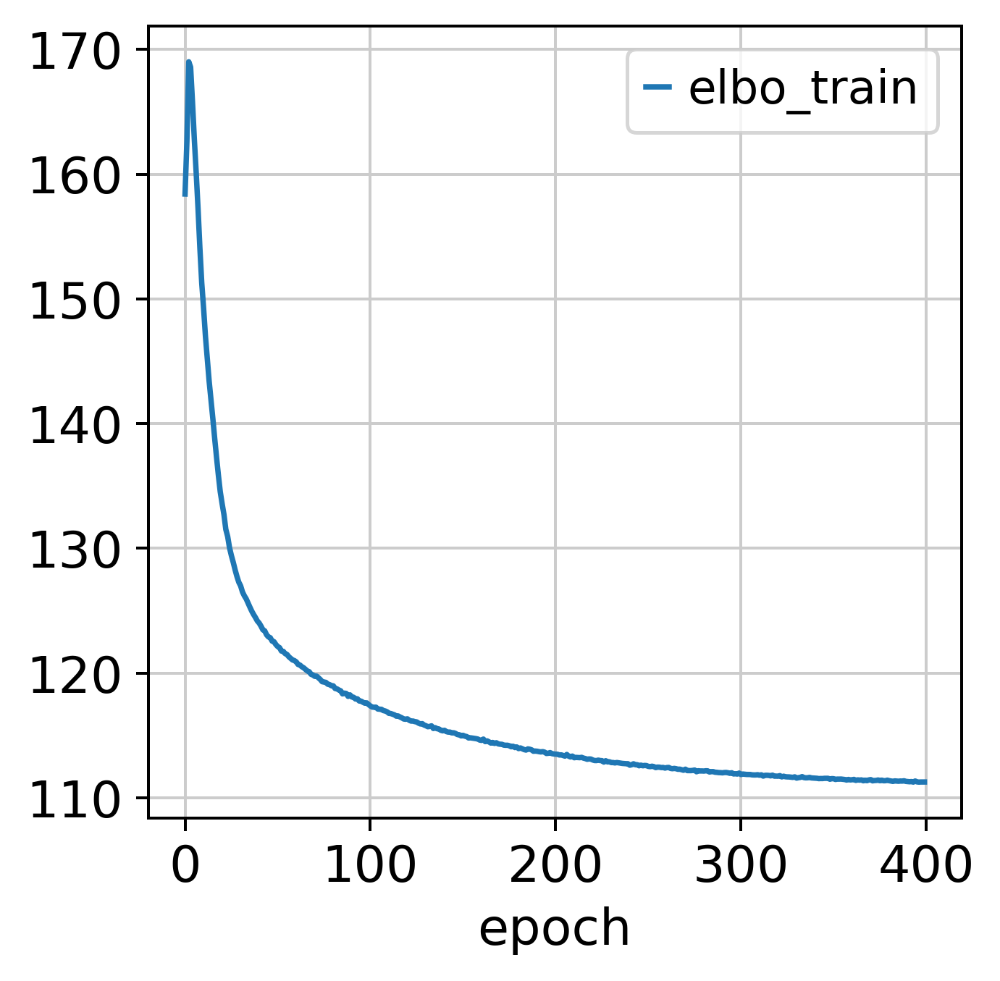

In [28]:
scvi_model.history['elbo_train'].plot()

In [29]:
adata.obsm['X_scvi'] = scvi_model.get_latent_representation()

+ Transfer of annotations with scANVI

In [45]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [46]:
scanvi_model.train(400)

INFO     Training for 400 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 400/400: 100%|██████████████████████████████████████████████████| 400/400 [12:00<00:00,  1.36s/it, v_num=1, train_loss_step=139, train_loss_epoch=139]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████████████████████████████████████████████| 400/400 [12:00<00:00,  1.80s/it, v_num=1, train_loss_step=139, train_loss_epoch=139]


<Axes: xlabel='epoch'>

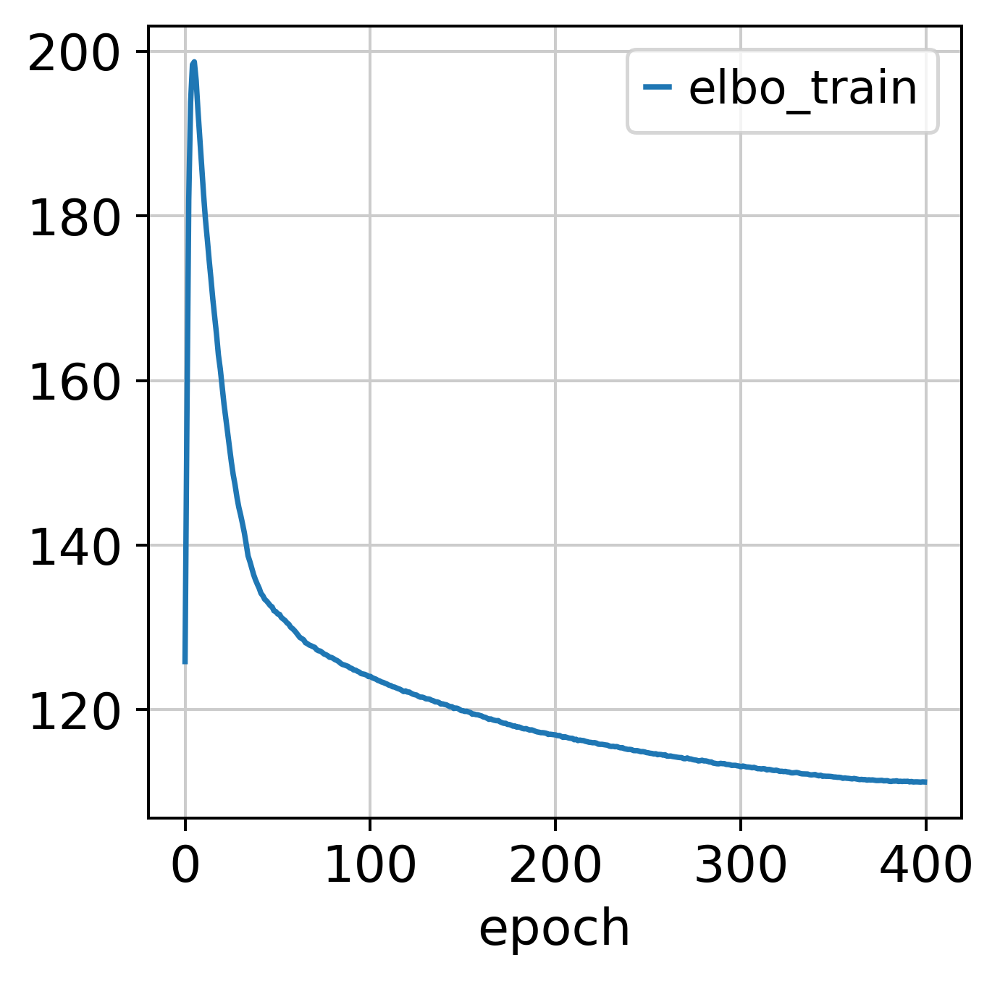

In [47]:
scanvi_model.history['elbo_train'].plot()

In [48]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

In [49]:
adata.obs["C_scANVI"].value_counts()

C_scANVI
MTRNR2L12+ASS1+_SC    7435
RPS10+_RPS17+_SC      7272
FXYD3+_CKB+_SC        2161
Name: count, dtype: int64

In [50]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

+ Visualize dataset

In [51]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [58]:
sc.set_figure_params(dpi = 300, figsize=(10,5))
sc.pl.umap(adata, color = ['Study_name', 'seed_labels', 'C_scANVI', 'Library_Preparation_Protocol', 'Donor_ID'], ncols = 3, frameon = False, size = 6)

/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categoric

+ Merge predicted stem cells to xenium object

In [76]:
adata3 = adata2.copy()

In [77]:
adata2 = adata2[adata2.obs['dataset'] == 'query']

In [78]:
adata2.obs.set_index('cell_id', inplace=True)
adata_xenium.obs.set_index('cell_id', inplace=True)

In [90]:
adata_xenium.obs = adata_xenium.obs.join(adata2.obs[['C_scANVI']], how='left')

In [92]:
adata_xenium.obs.rename(columns = {'C_scANVI': 'stem_cell_type'}, inplace = True)

In [98]:
input = '/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/10X_Xenium_data/Xenium_Non-diseased_pre-designed_pallet_with_predicted_epi_labels.h5ad'
adata_xenium_full = sc.read_h5ad(input)

/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [100]:
adata_xenium_full.obs.set_index('cell_id', inplace=True)

In [102]:
adata_xenium_full.obs = adata_xenium_full.obs.join(adata_xenium.obs[['stem_cell_type']], how='left')

In [104]:
adata_xenium_full.obs['stem_cell_type'].value_counts()

stem_cell_type
RPS10+_RPS17+_SC      3755
MTRNR2L12+ASS1+_SC    3558
FXYD3+_CKB+_SC        1738
Name: count, dtype: int64

In [105]:
adata_xenium_full.write_h5ad('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/10X_Xenium_data/Xenium_Non-diseased_pre-designed_pallet_with_predicted_epi_and_SC_labels.h5ad')